## 1. VGG-19 and ResNet 50 Neural Style Transfer





In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy



In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.set_default_device(device)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no GPU

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])  # transform it into a torch tensor


def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img = image_loader("drive/MyDrive/ML-CS/ML Project/sample_images/picasso.jpg")
content_img = image_loader("drive/MyDrive/ML-CS/ML Project/sample_images/dancing.jpg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"

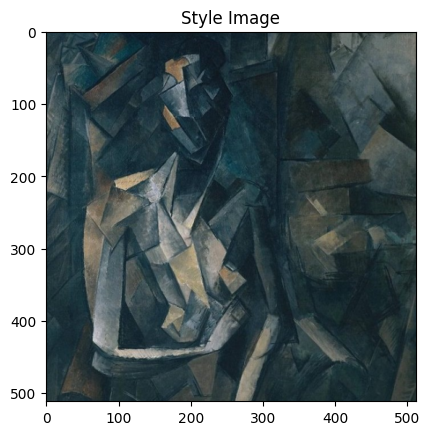

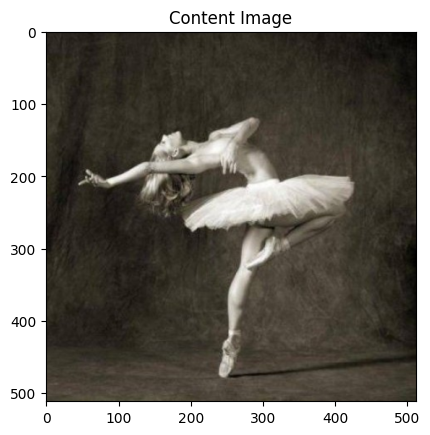

In [ ]:
unloader = transforms.ToPILImage()  # reconvert into PIL image

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

In [ ]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [ ]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resize F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)

In [ ]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [ ]:
cnn = vgg19(weights=VGG19_Weights.DEFAULT).features.eval()

In [ ]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406])
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225])

# create a module to normalize input image so we can easily put it in a
# ``nn.Sequential``
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize ``img``
        return (img - self.mean) / self.std

In [ ]:
# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses
    content_losses = []
    style_losses = []

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

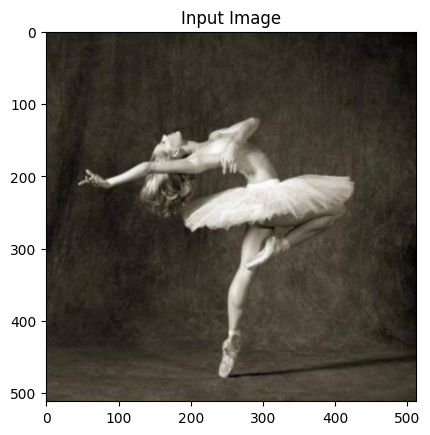

In [ ]:
input_img = content_img.clone()
plt.figure()
imshow(input_img, title='Input Image')

In [ ]:
def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer

In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # Clamp image value beyong the scope
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

Building the style transfer model..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Optimizing..
run [50]:
Style Loss : 4.103158 Content Loss: 4.148073

run [100]:
Style Loss : 1.149606 Content Loss: 3.042620

run [150]:
Style Loss : 0.716358 Content Loss: 2.660147

run [200]:
Style Loss : 0.488196 Content Loss: 2.496191

run [250]:
Style Loss : 0.353401 Content Loss: 2.401790

run [300]:
Style Loss : 0.266189 Content Loss: 2.352005



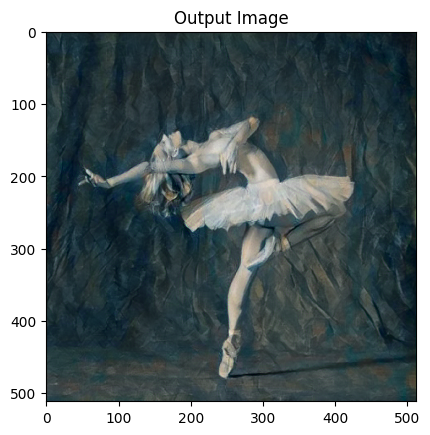

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

### 1.1 VGG-19 using Wiki Art

In [ ]:
!pip install datasets

In [ ]:
from datasets import load_dataset
dataset = load_dataset("huggan/wikiart",split = "train",streaming = True)
dataset_head = list(dataset.take(5))


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Resolving data files:   0%|          | 0/72 [00:00<?, ?it/s]

In [ ]:
def image_loader(image):
    loader = transforms.Compose([
    transforms.Resize((imsize,imsize)),  # scale imported image
    transforms.ToTensor()])
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

image_loader(dataset_head[3]["image"]).shape

torch.Size([1, 3, 512, 512])

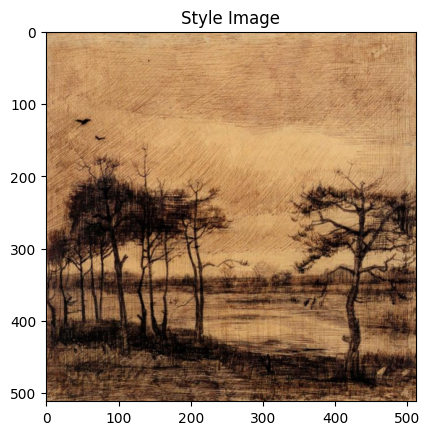

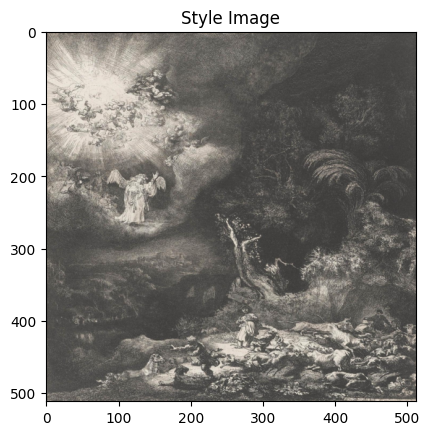

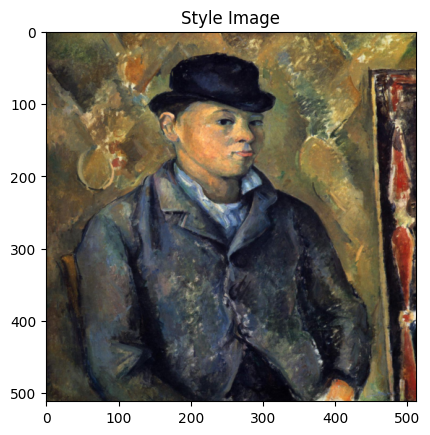

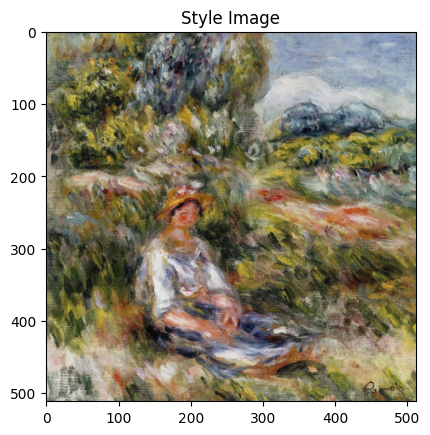

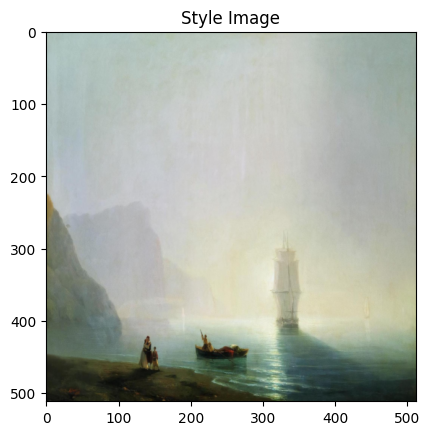

In [ ]:
for i in range(5):
    plt.figure()
    imshow(image_loader(dataset_head[i]["image"]), title='Style Image')

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


run [50]:
Style Loss : 74.279167 Content Loss: 18.891573

run [100]:
Style Loss : 27.833784 Content Loss: 17.167950

run [150]:
Style Loss : 16.202745 Content Loss: 15.100868

run [200]:
Style Loss : 10.262115 Content Loss: 13.932338

run [250]:
Style Loss : 6.984053 Content Loss: 13.080172

run [300]:
Style Loss : 4.658653 Content Loss: 12.444315



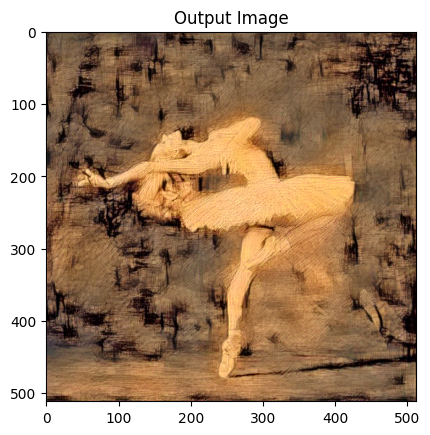

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 35.976776 Content Loss: 12.062686

run [100]:
Style Loss : 4.158801 Content Loss: 10.689391

run [150]:
Style Loss : 1.548862 Content Loss: 9.398305

run [200]:
Style Loss : 1.081783 Content Loss: 8.379086

run [250]:
Style Loss : 0.754318 Content Loss: 7.779644

run [300]:
Style Loss : 0.614631 Content Loss: 7.319782



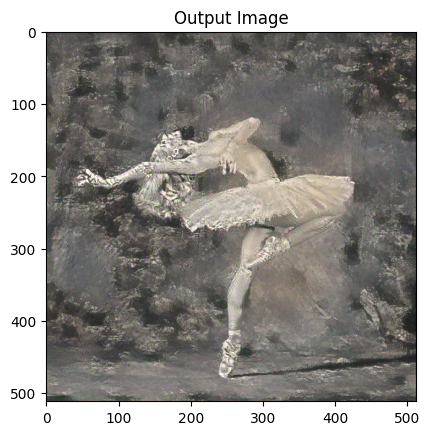

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 33.047798 Content Loss: 9.235045

run [100]:
Style Loss : 14.209366 Content Loss: 9.051122

run [150]:
Style Loss : 7.171812 Content Loss: 8.304254

run [200]:
Style Loss : 3.746784 Content Loss: 7.584332

run [250]:
Style Loss : 1.932575 Content Loss: 6.989995

run [300]:
Style Loss : 1.054492 Content Loss: 6.526472



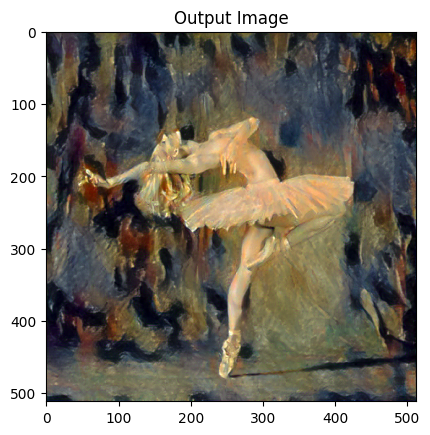

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 14.437701 Content Loss: 13.550704

run [100]:
Style Loss : 6.710182 Content Loss: 12.874264

run [150]:
Style Loss : 3.444119 Content Loss: 12.260128

run [200]:
Style Loss : 1.939009 Content Loss: 11.753359

run [250]:
Style Loss : 1.187958 Content Loss: 11.357721

run [300]:
Style Loss : 0.800309 Content Loss: 11.088178



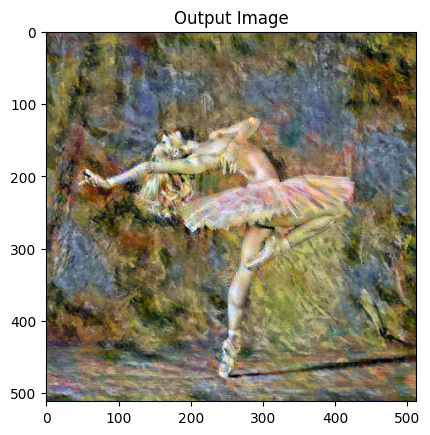

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 63.768093 Content Loss: 4.529715

run [100]:
Style Loss : 35.380768 Content Loss: 4.335090

run [150]:
Style Loss : 11.607658 Content Loss: 4.545507

run [200]:
Style Loss : 4.915346 Content Loss: 3.836917

run [250]:
Style Loss : 2.156377 Content Loss: 3.513329

run [300]:
Style Loss : 1.335594 Content Loss: 3.287749



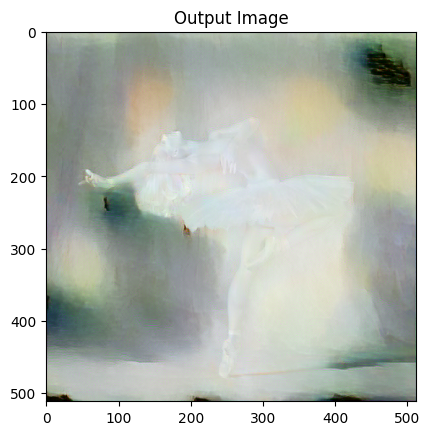

In [ ]:
for i in range(5):

    output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, image_loader(dataset_head[i]["image"]), input_img)

    plt.figure()
    imshow(output, title='Output Image')

    plt.ioff()
    plt.show()

### 1.2 ResNet-50 Neural Style Transfer using Wiki Art

In [ ]:
from torchvision.models import resnet50,ResNet50_Weights
import torchvision

In [ ]:
cnn2 = resnet50(weights=ResNet50_Weights.DEFAULT).eval()
cnn2

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
import torch.nn as nn

# desired depth layers to compute style/content losses :
content_layers_default = ['conv_10',"conv_20"]
style_layers_default = ['conv_1', 'conv_5', 'conv_10', 'conv_20', 'conv_30']

def get_style_model_and_losses2(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std)

    # just in order to have an iterable access to or list of content/style
    # losses
    content_losses = []
    style_losses = []

    # assuming that ``cnn`` is a ``nn.Sequential``, so we make a new ``nn.Sequential``
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
            model.add_module(name, layer)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ``ContentLoss``
            # and ``StyleLoss`` we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
            model.add_module(name, layer)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
            model.add_module(name, layer)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
            model.add_module(name, layer)
        elif isinstance(layer, nn.Sequential):
            for sub_layer in layer.children():
                if isinstance(sub_layer,torchvision.models.resnet.Bottleneck):
                    for subname, sublayer in sub_layer.named_children():
                        if isinstance(sublayer,nn.Conv2d):
                            i += 1
                            name = 'conv_{}'.format(i)
                            model.add_module(name, sublayer)
                        elif isinstance(sublayer,nn.BatchNorm2d):
                            name = 'bn_{}'.format(i)
                            model.add_module(name, sublayer)
                        elif isinstance(sublayer, nn.ReLU):
                            name = 'relu_{}'.format(i)
                            layer = nn.ReLU(inplace=False)
                            model.add_module(name, sublayer)
                        elif isinstance(sublayer,nn.Sequential):
                            name = "sequential_{}".format(i)
                            model.add_module(name,sublayer)


        elif isinstance(layer, nn.Linear):
            name = "Li_{}".format(i)
            model.add_module(name, layer)

        elif isinstance(layer,nn.AdaptiveAvgPool2d):
            name = "Aap_{}".format(i)
            model.add_module(name, layer)

        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))


        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)

            print("Compute Content Loss", content_loss)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            #print(target_feature)
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

# get_style_model_and_losses2(cnn2, cnn_normalization_mean, cnn_normalization_std,
#                                style_img, content_img,
#                                content_layers=content_layers_default,
#                                style_layers=style_layers_default)


In [ ]:
def run_style_transfer2(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses2(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    # We also put the model in evaluation mode, so that specific layers
    # such as dropout or batch normalization layers behave correctly.
    model.eval()
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            #print(style_score)
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:8f} Content Loss: {:8f}'.format(
                    style_score, content_score))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 0.000003 Content Loss: 0.000000

run [100]:
Style Loss : 0.000003 Content Loss: 0.000000

run [150]:
Style Loss : 0.000003 Content Loss: 0.000000

run [200]:
Style Loss : 0.000003 Content Loss: 0.000000

run [250]:
Style Loss : 0.000003 Content Loss: 0.000000

run [300]:
Style Loss : 0.000003 Content Loss: 0.000000



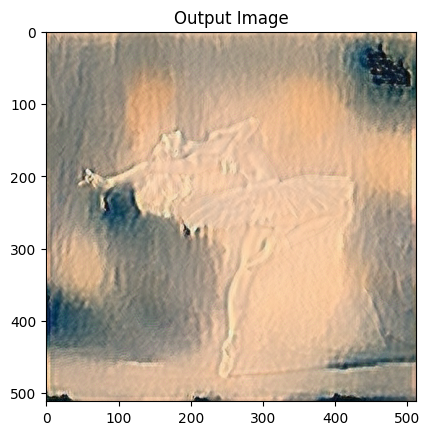

In [ ]:
output = run_style_transfer2(cnn2, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

Building the style transfer model..
Compute Content Loss ContentLoss()
Optimizing..


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


run [50]:
Style Loss : 23.727396 Content Loss: 39.821156

run [100]:
Style Loss : 17.964502 Content Loss: 34.447052

run [150]:
Style Loss : 14.687414 Content Loss: 32.051418

run [200]:
Style Loss : 12.520247 Content Loss: 30.462517

run [250]:
Style Loss : 10.763007 Content Loss: 29.517220

run [300]:
Style Loss : 9.376774 Content Loss: 28.800175



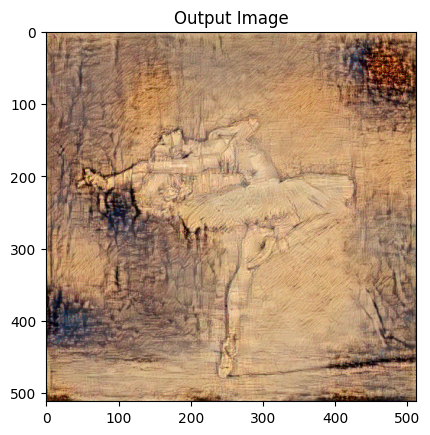

Building the style transfer model..
Compute Content Loss ContentLoss()
Optimizing..
run [50]:
Style Loss : 44.437702 Content Loss: 16.908936

run [100]:
Style Loss : 23.541836 Content Loss: 14.201183

run [150]:
Style Loss : 12.948038 Content Loss: 13.018947

run [200]:
Style Loss : 8.392668 Content Loss: 12.148305

run [250]:
Style Loss : 6.755522 Content Loss: 11.621096

run [300]:
Style Loss : 5.969402 Content Loss: 11.214271



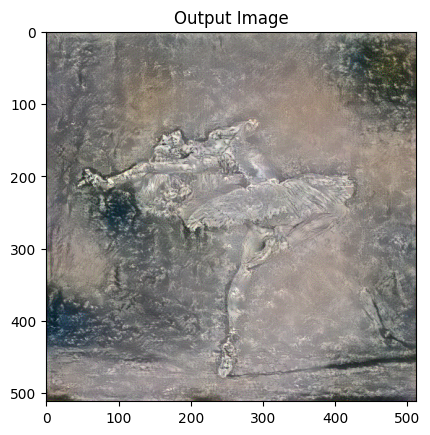

Building the style transfer model..
Compute Content Loss ContentLoss()
Optimizing..
run [50]:
Style Loss : 56.206299 Content Loss: 36.253227

run [100]:
Style Loss : 30.723862 Content Loss: 33.052082

run [150]:
Style Loss : 24.892097 Content Loss: 31.071039

run [200]:
Style Loss : 22.467962 Content Loss: 29.971619

run [250]:
Style Loss : 20.680363 Content Loss: 29.263988

run [300]:
Style Loss : 19.113735 Content Loss: 28.826649



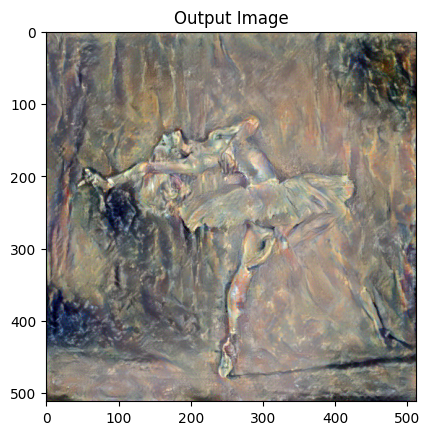

Building the style transfer model..
Compute Content Loss ContentLoss()
Optimizing..
run [50]:
Style Loss : 20.698584 Content Loss: 47.798706

run [100]:
Style Loss : 9.867359 Content Loss: 43.981201

run [150]:
Style Loss : 7.783732 Content Loss: 41.978355

run [200]:
Style Loss : 6.824203 Content Loss: 40.830971

run [250]:
Style Loss : 6.196002 Content Loss: 40.110626

run [300]:
Style Loss : 5.775125 Content Loss: 39.619995



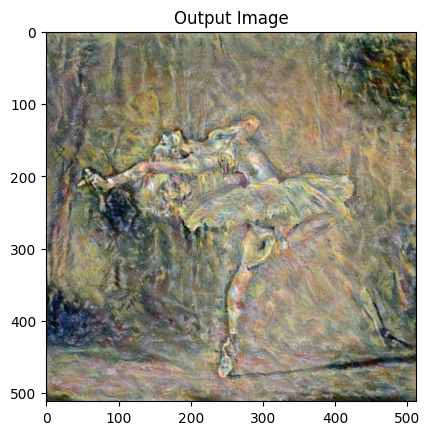

Building the style transfer model..
Compute Content Loss ContentLoss()
Optimizing..
run [50]:
Style Loss : 68.535652 Content Loss: 13.398102

run [100]:
Style Loss : 40.947739 Content Loss: 10.464292

run [150]:
Style Loss : 35.142410 Content Loss: 9.221792

run [200]:
Style Loss : 32.043354 Content Loss: 8.605579

run [250]:
Style Loss : 29.058092 Content Loss: 8.227362

run [300]:
Style Loss : 25.740444 Content Loss: 8.123597



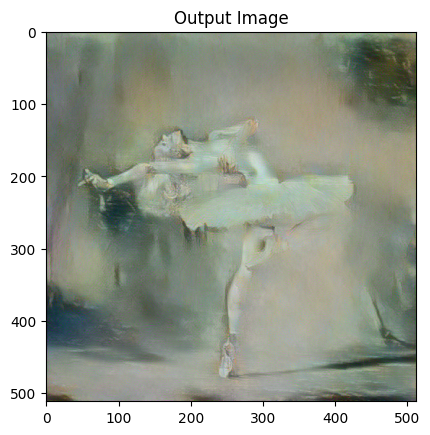

In [ ]:
for i in range(5):

    output = run_style_transfer2(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, image_loader(dataset_head[i]["image"]), input_img)

    plt.figure()
    imshow(output, title='Output Image')

    plt.ioff()
    plt.show()

## 2. Cycle GAN with Wiki Art

Reset the runtime before running this part


In [ ]:
# basic packages
import numpy as np
import pandas as pd
import scipy
import pickle
import random
import os

# loading in and transforming data
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import PIL
from PIL import Image
import imageio

# visualizing data
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

set_seed(42)

In [ ]:
def save_checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir="drive/MyDrive/ML-CS/ML Project/cycle_gan_save/"):
    """
    Saves the parameters of both generators and discriminators.
    """
    #Path
    G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
    D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
    D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
    #Saving
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)

In [ ]:
def load_checkpoint(checkpoint_path, map_location=None):
    """
    Load checkoint
    """
    #model.load_state_dict(torch.load(checkpoint_path))
    checkpoint = torch.load(checkpoint_path, map_location=map_location)
    print(' [*] Loading checkpoint from %s succeed!' % checkpoint_path)
    return checkpoint

In [ ]:
def reverse_normalize(image, mean_=0.5, std_=0.5):
    if torch.is_tensor(image):
        image = image.detach().numpy()
    un_normalized_img = image * std_ + mean_
    un_normalized_img = un_normalized_img * 255
    return np.uint8(un_normalized_img)

In [ ]:
def show_test(fixed_Y, fixed_X, G_YtoX, G_XtoY, mean_=0.5, std_=0.5):
    """
    Shows results of generates based on test image input.
    """
    #Identify correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    #Create fake pictures for both cycles
    fake_X = G_YtoX(fixed_Y.to(device))
    fake_Y = G_XtoY(fixed_X.to(device))

    #Generate grids
    grid_x =  make_grid(fixed_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_y =  make_grid(fixed_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_x =  make_grid(fake_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_y =  make_grid(fake_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

    #Normalize pictures to pixel range rom 0 to 255
    X, fake_X = reverse_normalize(grid_x, mean_, std_), reverse_normalize(grid_fake_x, mean_, std_)
    Y, fake_Y = reverse_normalize(grid_y, mean_, std_), reverse_normalize(grid_fake_y, mean_, std_)

    #Transformation from X -> Y
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(20, 10))
    ax1.imshow(X)
    ax1.axis('off')
    ax1.set_title('X')
    ax2.imshow(fake_Y)
    ax2.axis('off')
    ax2.set_title('Fake Y  (Wikiart Style)')
    plt.show()

In [ ]:
class ImageDataset(Dataset):
        """
        Custom dataset
        """

        def __init__(self, img_path, img_size=256, normalize=True):
            self.img_path = img_path

            if normalize:
                self.transform = transforms.Compose([
                    transforms.Resize((img_size,img_size)),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5])
                ])
            else:
                self.transform = transforms.Compose([
                    transforms.Resize((img_size,img_size)),
                    transforms.ToTensor()
                ])

            #Dictionary entries
            self.img_idx = dict()
            for number_, img_ in enumerate(os.listdir(self.img_path)):
                self.img_idx[number_] = img_

        def __len__(self):
            #Length of dataset --> number of images
            return len(self.img_idx)

        def __getitem__(self, idx):
            img_path = os.path.join(self.img_path, self.img_idx[idx])
            img = Image.open(img_path)
            img = self.transform(img)

            return img

In [ ]:
#Create datasets
dataset_style = ImageDataset("drive/MyDrive/ML-CS/ML Project/style_jpg/", img_size=128, normalize=True)
dataset_photo = ImageDataset("drive/MyDrive/ML-CS/ML Project/photo_jpg/", img_size=128, normalize=True)

In [ ]:
#Create test loaders
batch_size_test = 32
batch_size= 128
test_dataloader_Y = DataLoader(dataset_style, batch_size=batch_size_test, shuffle=False, num_workers=0, pin_memory=True)
test_dataloader_X = DataLoader(dataset_photo, batch_size=batch_size_test, shuffle=False, num_workers=0, pin_memory=True)
dataloader_Y = DataLoader(dataset_style, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
dataloader_X = DataLoader(dataset_photo, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)

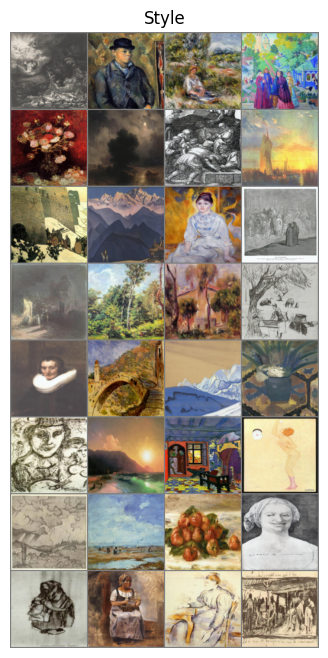

In [ ]:
#Check dataset & dataloader results
dataiter = iter(test_dataloader_Y)
images_normalized = next(dataiter)
grid_normalized = make_grid(images_normalized, nrow=4).permute(1, 2, 0).detach().numpy()
grid_original = reverse_normalize(grid_normalized)
fig = plt.figure(figsize=(12, 8))
plt.imshow(grid_original)
plt.axis('off')
plt.title('Style')
plt.show()

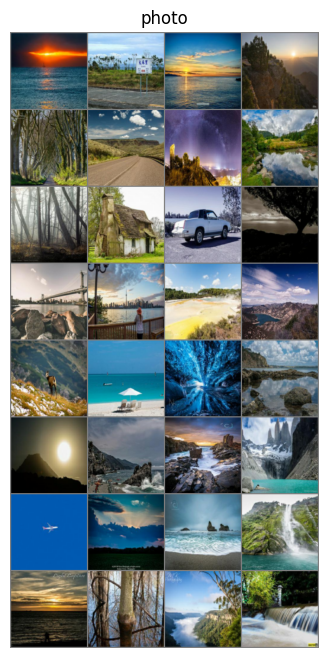

In [ ]:
#Check dataset & dataloader results
dataiter = iter(test_dataloader_X)
images_normalized = next(dataiter)
grid_normalized = make_grid(images_normalized, nrow=4).permute(1, 2, 0).detach().numpy()
grid_original = reverse_normalize(grid_normalized)
fig = plt.figure(figsize=(12, 8))
plt.imshow(grid_original)
plt.axis('off')
plt.title('photo')
plt.show()

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False):
    """
    Creates a convolutional layer, with optional batch / instance normalization.
    """

    #Add layers
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)

    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    return nn.Sequential(*layers)

In [ ]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()
        """
        Input is RGB image (256x256x3) while output is a single value

        determine size = [(W−K+2P)/S]+1
        W: input=256
        K: kernel_size=4
        P: padding=1
        S: stride=2
        """

        #convolutional layers, increasing in depth
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4) # (128, 128, 64)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4, instance_norm=True) # (32, 32, 256)
        self.conv4 = conv(in_channels=conv_dim*4, out_channels=conv_dim*8, kernel_size=4, instance_norm=True) # (16, 16, 512)
        self.conv5 = conv(in_channels=conv_dim*8, out_channels=conv_dim*8, kernel_size=4, batch_norm=True) # (8, 8, 512)

        #final classification layer
        self.conv6 = conv(conv_dim*8, out_channels=1, kernel_size=4, stride=1) # (8, 8, 1)

    def forward(self, x):

        #leaky relu applied to all conv layers but last
        out = F.leaky_relu(self.conv1(x), negative_slope=0.2)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv4(out), negative_slope=0.2)
#         out = F.leaky_relu(self.conv5(out), negative_slope=0.2)

        #classification layer (--> depending on the loss function we might want to use an activation function here, e.g. sigmoid)
        out = self.conv6(out)
        return out

In [ ]:
class ResidualBlock(nn.Module):

    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        """
        Residual blocks help the model to effectively learn the transformation from one domain to another.
        """
        self.conv1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)

    def forward(self, x):
        out_1 = F.relu(self.conv1(x))
        out_2 = x + self.conv2(out_1)
        return out_2

In [ ]:
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False, dropout=False, dropout_ratio=0.5):
    """
    Creates a transpose convolutional layer, with optional batch / instance normalization. Select either batch OR instance normalization.
    """

    #Add layers
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))

    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))

    #Dropout
    if dropout:
        layers.append(nn.Dropout2d(dropout_ratio))

    return nn.Sequential(*layers)

In [ ]:
class CycleGenerator(nn.Module):

    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()
        """
        Input is RGB image (256x256x3) while output is a single value

        determine size = [(W−K+2P)/S]+1
        W: input=256
        K: kernel_size=4
        P: padding=1
        S: stride=2
        """

        #Encoder layers
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4) # (128, 128, 64)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4, instance_norm=True) # (32, 32, 256)

        #Residual blocks (number depends on input parameter)
        res_layers = []
        for layer in range(n_res_blocks):
            res_layers.append(ResidualBlock(conv_dim*4))
        self.res_blocks = nn.Sequential(*res_layers)

        #Decoder layers
        self.deconv4 = deconv(in_channels=conv_dim*4, out_channels=conv_dim*2, kernel_size=4, instance_norm=True) # (64, 64, 128)
        self.deconv5 = deconv(in_channels=conv_dim*2, out_channels=conv_dim, kernel_size=4, instance_norm=True) # (128, 128, 64)
        self.deconv6 = deconv(in_channels=conv_dim, out_channels=3, kernel_size=4, instance_norm=True) # (256, 256, 3)

    def forward(self, x):
        """
        Given an image x, returns a transformed image.
        """

        #Encoder
        out = F.leaky_relu(self.conv1(x), negative_slope=0.2) # (128, 128, 64)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2) # (64, 64, 128)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2) # (32, 32, 256)

        #Residual blocks
        out = self.res_blocks(out)

        #Decoder
        out = F.leaky_relu(self.deconv4(out), negative_slope=0.2) # (64, 64, 128)
        out = F.leaky_relu(self.deconv5(out), negative_slope=0.2) # (128, 128, 64)
        out = torch.tanh(self.deconv6(out)) # (256, 256, 3)

        return out

In [ ]:
from torch.nn import init
def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model.
    The weights are taken from a normal distribution with mean = 0, std dev = 0.02.
    Param m: A module or layer in a network
    """
    #classname will be something like: `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__

    #normal distribution with given paramters
    std_dev = 0.02
    mean = 0.0

    # Initialize conv layer
    if hasattr(m, 'weight') and (classname.find('Conv') != -1):
        init.normal_(m.weight.data, mean, std_dev)

In [ ]:
def build_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):
    """
    Builds generators G_XtoY & G_YtoX and discriminators D_X & D_Y
    """

    #Generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)

    #Discriminators
    D_X = Discriminator(conv_dim=d_conv_dim) # Y-->X
    D_Y = Discriminator(conv_dim=d_conv_dim) # X-->Y

    #Weight initialization
    G_XtoY.apply(weights_init_normal)
    G_YtoX.apply(weights_init_normal)
    D_X.apply(weights_init_normal)
    D_Y.apply(weights_init_normal)

    #Moves models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y

In [ ]:
#Function call
G_XtoY, G_YtoX, D_X, D_Y = build_model()

Models moved to GPU.


In [ ]:
#Check model structure
def print_build(G_XtoY, G_YtoX, D_X, D_Y):
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()

print_build(G_XtoY, G_YtoX, D_X, D_Y)

                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      )
      (conv2): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3)

In [ ]:
def real_mse_loss(D_out, adverserial_weight=1):
    #how close is the produced output from being "real"?
    mse_loss = torch.mean((D_out-1)**2)*adverserial_weight
    return mse_loss

def fake_mse_loss(D_out, adverserial_weight=1):
    #how close is the produced output from being "false"?
    mse_loss = torch.mean(D_out**2)*adverserial_weight
    return mse_loss

def cycle_consistency_loss(real_img, reconstructed_img, lambda_weight=1):
    reconstr_loss = torch.mean(torch.abs(real_img - reconstructed_img))
    return lambda_weight*reconstr_loss

def identity_loss(real_img, generated_img, identity_weight=1):
    ident_loss = torch.mean(torch.abs(real_img - generated_img))
    return identity_weight*ident_loss

In [ ]:
import torch.optim as optim

#hyperparameter
lr=0.0002 #0.0002
beta1=0.500 #exponential decay rate for the first moment estimates
beta2=0.999 #exponential decay rate for the second-moment estimates
g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())

#Optimizers for generator and discriminator
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])

In [ ]:
def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=1000):

    #Losses over time
    losses = []

    #Additional weighting parameters (in reality only 2 are required as the third is kind of "given relatively" by the other two)
    adverserial_weight = 0.5
    lambda_weight = 10
    identity_weight = 5

    #Get some fixed data from domains X and Y for sampling. Images are held constant throughout training and allow us to inspect the model's performance.
    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)
    fixed_X = next(test_iter_X)
    fixed_Y = next(test_iter_Y)

    # batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    #Average loss over batches per epoch runs
    d_total_loss_avg = 0.0
    g_total_loss_avg = 0.0

    #Loop through epochs
    for epoch in range(1, n_epochs+1):

        #reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        #Get images from domain X
        images_X = next(iter_X)

        #Get images from domain Y
        images_Y = next(iter_Y)

        #move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)


        # ============================================
        #            TRAIN THE DISCRIMINATORS
        # ============================================


        # --------------------------------------------
        ## First: D_X, real and fake loss components
        # --------------------------------------------

        # Train with real images
        d_x_optimizer.zero_grad()

        # 1. Compute the discriminator losses on real images
        out_x = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x, adverserial_weight)

        # Train with fake images
        # 2. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # 3. Compute the fake loss for D_X
        out_x = D_X(fake_X)
        D_X_fake_loss = fake_mse_loss(out_x, adverserial_weight)

        # 4. Compute the total loss and perform backpropagation
        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward()
        d_x_optimizer.step()

        # --------------------------------------------
        ## Second: D_Y, real and fake loss components
        # --------------------------------------------

        # Train with real images
        d_y_optimizer.zero_grad()

        # 1. Compute the discriminator losses on real images
        out_y = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y, adverserial_weight)

        # Train with fake images
        # 2. Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        # 3. Compute the fake loss for D_Y
        out_y = D_Y(fake_Y)
        D_Y_fake_loss = fake_mse_loss(out_y, adverserial_weight)

        # 4. Compute the total loss and perform backprop
        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward()
        d_y_optimizer.step()

        # 5. Compute total discriminator loss
        d_total_loss = D_X_real_loss + D_X_fake_loss + D_Y_real_loss + D_Y_fake_loss


        # =========================================
        #            TRAIN THE GENERATORS
        # =========================================


        # --------------------------------------------
        ## First: generate fake X images and reconstructed Y images
        # --------------------------------------------

        #Back to the start
        g_optimizer.zero_grad()

        # 1. Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # 2. Compute the generator loss based on domain X
        out_x = D_X(fake_X)
        g_YtoX_loss = real_mse_loss(out_x, adverserial_weight)

        # 3. Create a reconstructed y
        reconstructed_Y = G_XtoY(fake_X)

        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=lambda_weight)

        # 5. Compute the identity loss from transformation Y-->X
        identity_y_loss = identity_loss(images_Y, fake_X, identity_weight=identity_weight)

        # --------------------------------------------
        ## Second: generate fake Y images and reconstructed X images
        # --------------------------------------------

        # 1. Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        # 2. Compute the generator loss based on domain Y
        out_y = D_Y(fake_Y) #if discriminator believes picture to be from domain Y it returns values cloer to 1, else closer to 0
        g_XtoY_loss = real_mse_loss(out_y, adverserial_weight)

        # 3. Create a reconstructed x
        reconstructed_X = G_YtoX(fake_Y)

        # 4. Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=lambda_weight)

        # 5. Compute the identity loss from transformation X-->Y
        identity_x_loss = identity_loss(images_X, fake_Y, identity_weight=identity_weight)

        # 6. Add up all generator and reconstructed losses and perform backprop
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss + identity_y_loss + identity_x_loss
        g_total_loss.backward()
        g_optimizer.step()


        # =========================================
        # Admin
        # =========================================


        #Average loss
        d_total_loss_avg = d_total_loss_avg + d_total_loss / batches_per_epoch
        g_total_loss_avg = g_total_loss_avg + g_total_loss / batches_per_epoch

        # Print log info
        print_every = batches_per_epoch
        if epoch % print_every == 0:
            # append real and fake discriminator losses and the generator loss
            losses.append((d_total_loss_avg.item(), g_total_loss_avg.item()))
            true_epoch_n = int(epoch/batches_per_epoch)
            true_epoch_total = int(n_epochs/batches_per_epoch)
            print('Epoch [{:5d}/{:5d}] | d_total_loss_avg: {:6.4f} | g_total_loss: {:6.4f}'.format(
                    true_epoch_n, true_epoch_total, d_total_loss_avg.item(), g_total_loss_avg.item()))

        #Show the generated samples
        show_every = (batches_per_epoch*10)
        if epoch % show_every == 0:
            #set generators to eval mode for image generation
            G_YtoX.eval()
            G_XtoY.eval()
            test_images = show_test(fixed_Y, fixed_X, G_YtoX, G_XtoY)
            #set generators to train mode to continue training
            G_YtoX.train()
            G_XtoY.train()

#         #save the model parameters
        checkpoint_every=16
        if epoch % checkpoint_every == 0:
            save_checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

        #reset average loss for each epoch
        if epoch % batches_per_epoch == 0:
            d_total_loss_avg = 0.0
            g_total_loss_avg = 0.0

    return losses

In [ ]:
batches_per_epoch = min(len(dataloader_X), len(dataloader_Y))
epoch_true = 128

Epoch [    1/  128] | d_total_loss_avg: 5.7287 | g_total_loss: 21.0696
Epoch [    2/  128] | d_total_loss_avg: 4.2736 | g_total_loss: 20.9870
Epoch [    3/  128] | d_total_loss_avg: 3.9989 | g_total_loss: 19.9526
Epoch [    4/  128] | d_total_loss_avg: 3.8495 | g_total_loss: 19.0664
Epoch [    5/  128] | d_total_loss_avg: 3.8363 | g_total_loss: 18.0837
Epoch [    6/  128] | d_total_loss_avg: 3.8860 | g_total_loss: 18.5495
Epoch [    7/  128] | d_total_loss_avg: 2.9546 | g_total_loss: 15.6504
Epoch [    8/  128] | d_total_loss_avg: 1.3827 | g_total_loss: 14.1814
Epoch [    9/  128] | d_total_loss_avg: 1.1882 | g_total_loss: 13.4418
Epoch [   10/  128] | d_total_loss_avg: 1.0713 | g_total_loss: 13.0134


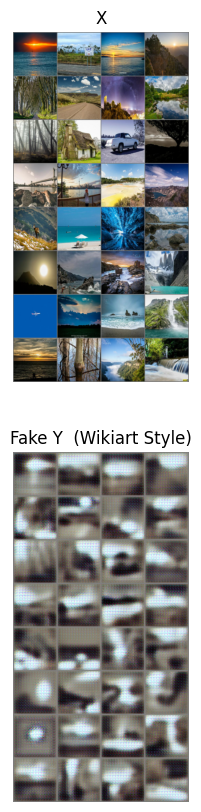

Epoch [   11/  128] | d_total_loss_avg: 1.8025 | g_total_loss: 13.3943
Epoch [   12/  128] | d_total_loss_avg: 1.1537 | g_total_loss: 11.9105
Epoch [   13/  128] | d_total_loss_avg: 0.8288 | g_total_loss: 11.7551
Epoch [   14/  128] | d_total_loss_avg: 0.7180 | g_total_loss: 12.0315
Epoch [   15/  128] | d_total_loss_avg: 0.7255 | g_total_loss: 11.9877
Epoch [   16/  128] | d_total_loss_avg: 0.7038 | g_total_loss: 11.6580
Epoch [   17/  128] | d_total_loss_avg: 0.8018 | g_total_loss: 11.3199
Epoch [   18/  128] | d_total_loss_avg: 0.7440 | g_total_loss: 11.7225
Epoch [   19/  128] | d_total_loss_avg: 0.6850 | g_total_loss: 11.4629
Epoch [   20/  128] | d_total_loss_avg: 0.6497 | g_total_loss: 11.4021


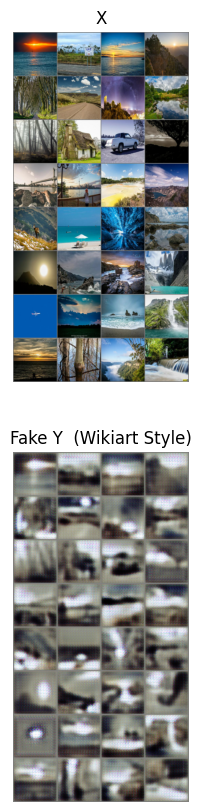

Epoch [   21/  128] | d_total_loss_avg: 0.6366 | g_total_loss: 11.0878
Epoch [   22/  128] | d_total_loss_avg: 0.6287 | g_total_loss: 10.8965
Epoch [   23/  128] | d_total_loss_avg: 0.5701 | g_total_loss: 11.2833
Epoch [   24/  128] | d_total_loss_avg: 0.5097 | g_total_loss: 10.7595
Epoch [   25/  128] | d_total_loss_avg: 0.5902 | g_total_loss: 10.5353
Epoch [   26/  128] | d_total_loss_avg: 0.5962 | g_total_loss: 10.4167
Epoch [   27/  128] | d_total_loss_avg: 0.5892 | g_total_loss: 10.3715
Epoch [   28/  128] | d_total_loss_avg: 0.5365 | g_total_loss: 10.7451
Epoch [   29/  128] | d_total_loss_avg: 0.5184 | g_total_loss: 10.8928
Epoch [   30/  128] | d_total_loss_avg: 0.4824 | g_total_loss: 9.8678


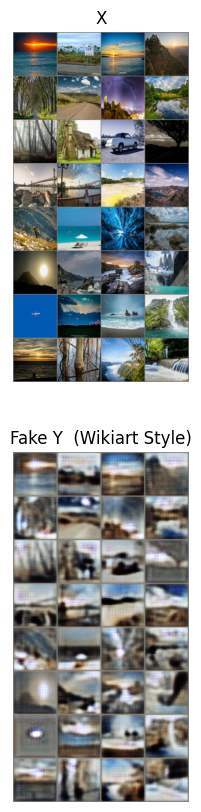

Epoch [   31/  128] | d_total_loss_avg: 0.4977 | g_total_loss: 11.1393
Epoch [   32/  128] | d_total_loss_avg: 0.5123 | g_total_loss: 10.4374
Epoch [   33/  128] | d_total_loss_avg: 0.4815 | g_total_loss: 10.3100
Epoch [   34/  128] | d_total_loss_avg: 0.5183 | g_total_loss: 10.1644
Epoch [   35/  128] | d_total_loss_avg: 0.5726 | g_total_loss: 10.3694
Epoch [   36/  128] | d_total_loss_avg: 0.6208 | g_total_loss: 9.7078
Epoch [   37/  128] | d_total_loss_avg: 0.4949 | g_total_loss: 10.2033
Epoch [   38/  128] | d_total_loss_avg: 0.4902 | g_total_loss: 10.2597
Epoch [   39/  128] | d_total_loss_avg: 0.4454 | g_total_loss: 10.0720
Epoch [   40/  128] | d_total_loss_avg: 0.5215 | g_total_loss: 9.5517


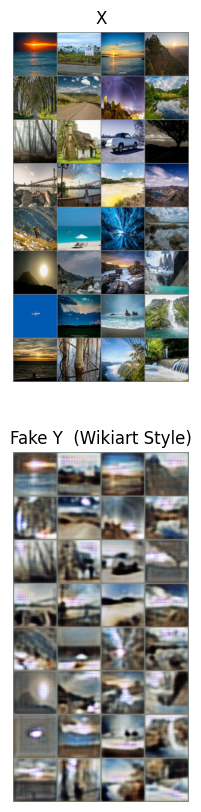

Epoch [   41/  128] | d_total_loss_avg: 0.6943 | g_total_loss: 10.1199
Epoch [   42/  128] | d_total_loss_avg: 0.6748 | g_total_loss: 9.7477
Epoch [   43/  128] | d_total_loss_avg: 0.4442 | g_total_loss: 9.4824
Epoch [   44/  128] | d_total_loss_avg: 0.4541 | g_total_loss: 9.8276
Epoch [   45/  128] | d_total_loss_avg: 0.3958 | g_total_loss: 9.9072
Epoch [   46/  128] | d_total_loss_avg: 0.3790 | g_total_loss: 9.9093
Epoch [   47/  128] | d_total_loss_avg: 0.3725 | g_total_loss: 9.7382
Epoch [   48/  128] | d_total_loss_avg: 0.3530 | g_total_loss: 9.6741
Epoch [   49/  128] | d_total_loss_avg: 0.3946 | g_total_loss: 9.3728
Epoch [   50/  128] | d_total_loss_avg: 0.3779 | g_total_loss: 8.9643


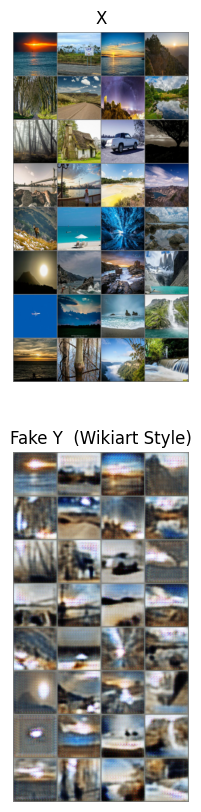

Epoch [   51/  128] | d_total_loss_avg: 0.3662 | g_total_loss: 9.8736
Epoch [   52/  128] | d_total_loss_avg: 0.4088 | g_total_loss: 9.1901
Epoch [   53/  128] | d_total_loss_avg: 0.5020 | g_total_loss: 9.4672
Epoch [   54/  128] | d_total_loss_avg: 0.5867 | g_total_loss: 9.2992
Epoch [   55/  128] | d_total_loss_avg: 0.5088 | g_total_loss: 9.0107
Epoch [   56/  128] | d_total_loss_avg: 0.5596 | g_total_loss: 9.6871
Epoch [   57/  128] | d_total_loss_avg: 0.5040 | g_total_loss: 9.4869
Epoch [   58/  128] | d_total_loss_avg: 0.3628 | g_total_loss: 9.2593
Epoch [   59/  128] | d_total_loss_avg: 0.3385 | g_total_loss: 9.0083
Epoch [   60/  128] | d_total_loss_avg: 0.3225 | g_total_loss: 9.0939


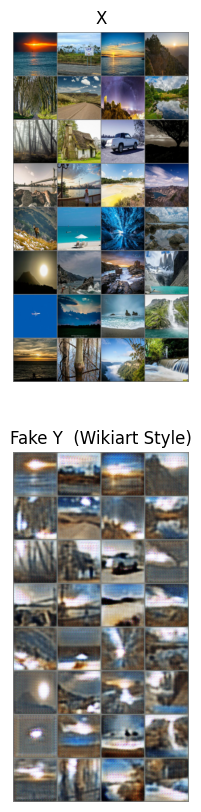

Epoch [   61/  128] | d_total_loss_avg: 0.3545 | g_total_loss: 9.3756
Epoch [   62/  128] | d_total_loss_avg: 0.3159 | g_total_loss: 9.0826
Epoch [   63/  128] | d_total_loss_avg: 0.3263 | g_total_loss: 8.5164
Epoch [   64/  128] | d_total_loss_avg: 0.3416 | g_total_loss: 9.3265
Epoch [   65/  128] | d_total_loss_avg: 0.3228 | g_total_loss: 8.9912
Epoch [   66/  128] | d_total_loss_avg: 0.3432 | g_total_loss: 8.9931
Epoch [   67/  128] | d_total_loss_avg: 0.3487 | g_total_loss: 9.2417
Epoch [   68/  128] | d_total_loss_avg: 0.3364 | g_total_loss: 9.2863
Epoch [   69/  128] | d_total_loss_avg: 0.3621 | g_total_loss: 8.9436
Epoch [   70/  128] | d_total_loss_avg: 0.4471 | g_total_loss: 9.2654


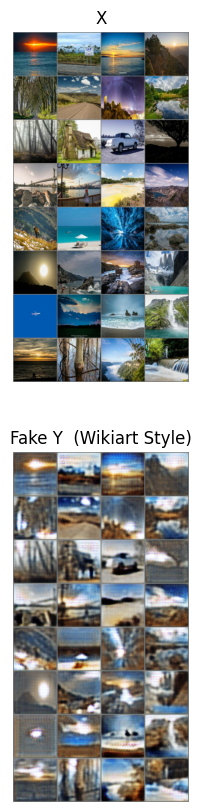

Epoch [   71/  128] | d_total_loss_avg: 0.4909 | g_total_loss: 8.9578
Epoch [   72/  128] | d_total_loss_avg: 0.4374 | g_total_loss: 8.9224
Epoch [   73/  128] | d_total_loss_avg: 0.3129 | g_total_loss: 8.8713
Epoch [   74/  128] | d_total_loss_avg: 0.2880 | g_total_loss: 9.2870
Epoch [   75/  128] | d_total_loss_avg: 0.2962 | g_total_loss: 8.5759
Epoch [   76/  128] | d_total_loss_avg: 0.3167 | g_total_loss: 8.8976
Epoch [   77/  128] | d_total_loss_avg: 0.2907 | g_total_loss: 8.8863
Epoch [   78/  128] | d_total_loss_avg: 0.3328 | g_total_loss: 8.6743
Epoch [   79/  128] | d_total_loss_avg: 0.3569 | g_total_loss: 8.7793
Epoch [   80/  128] | d_total_loss_avg: 0.3756 | g_total_loss: 8.8596


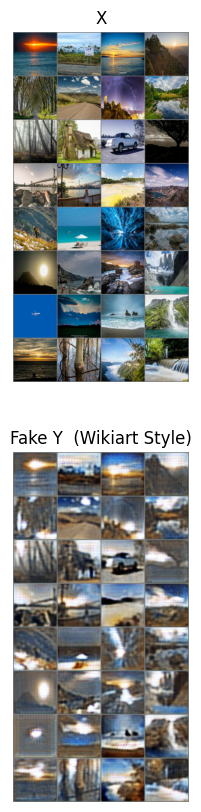

Epoch [   81/  128] | d_total_loss_avg: 0.3557 | g_total_loss: 9.0589
Epoch [   82/  128] | d_total_loss_avg: 0.3668 | g_total_loss: 8.9915
Epoch [   83/  128] | d_total_loss_avg: 0.3825 | g_total_loss: 8.9778
Epoch [   84/  128] | d_total_loss_avg: 0.3280 | g_total_loss: 8.8616
Epoch [   85/  128] | d_total_loss_avg: 0.3135 | g_total_loss: 8.7442
Epoch [   86/  128] | d_total_loss_avg: 0.2810 | g_total_loss: 8.9199
Epoch [   87/  128] | d_total_loss_avg: 0.2974 | g_total_loss: 8.8613
Epoch [   88/  128] | d_total_loss_avg: 0.2408 | g_total_loss: 9.1537
Epoch [   89/  128] | d_total_loss_avg: 0.2862 | g_total_loss: 9.1224
Epoch [   90/  128] | d_total_loss_avg: 0.2747 | g_total_loss: 9.2397


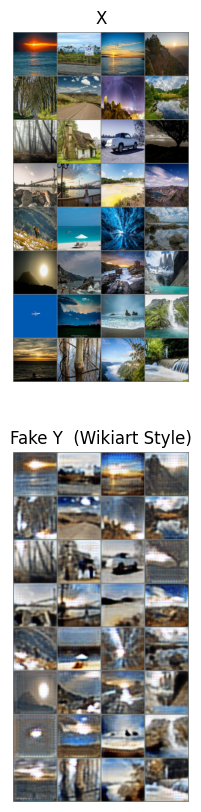

Epoch [   91/  128] | d_total_loss_avg: 0.2871 | g_total_loss: 8.9031
Epoch [   92/  128] | d_total_loss_avg: 0.2982 | g_total_loss: 8.6199
Epoch [   93/  128] | d_total_loss_avg: 0.2941 | g_total_loss: 8.8955
Epoch [   94/  128] | d_total_loss_avg: 0.2845 | g_total_loss: 8.6463
Epoch [   95/  128] | d_total_loss_avg: 0.3432 | g_total_loss: 8.9649
Epoch [   96/  128] | d_total_loss_avg: 0.3626 | g_total_loss: 8.3508
Epoch [   97/  128] | d_total_loss_avg: 0.4019 | g_total_loss: 8.6188
Epoch [   98/  128] | d_total_loss_avg: 0.4027 | g_total_loss: 8.7132
Epoch [   99/  128] | d_total_loss_avg: 0.3598 | g_total_loss: 8.6404
Epoch [  100/  128] | d_total_loss_avg: 0.3269 | g_total_loss: 8.8920


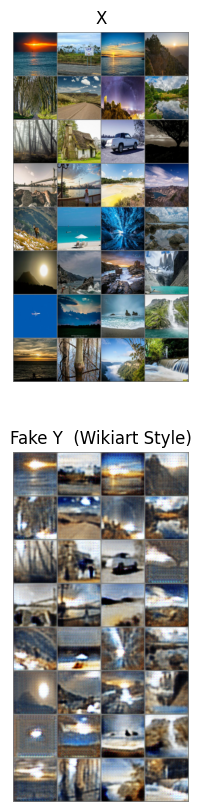

Epoch [  101/  128] | d_total_loss_avg: 0.3148 | g_total_loss: 8.3794
Epoch [  102/  128] | d_total_loss_avg: 0.3569 | g_total_loss: 9.0714
Epoch [  103/  128] | d_total_loss_avg: 0.3524 | g_total_loss: 8.5523
Epoch [  104/  128] | d_total_loss_avg: 0.2954 | g_total_loss: 8.3066
Epoch [  105/  128] | d_total_loss_avg: 0.2851 | g_total_loss: 8.5750
Epoch [  106/  128] | d_total_loss_avg: 0.2877 | g_total_loss: 8.3799
Epoch [  107/  128] | d_total_loss_avg: 0.2397 | g_total_loss: 8.5233
Epoch [  108/  128] | d_total_loss_avg: 0.2833 | g_total_loss: 8.7310
Epoch [  109/  128] | d_total_loss_avg: 0.2734 | g_total_loss: 8.4153
Epoch [  110/  128] | d_total_loss_avg: 0.2528 | g_total_loss: 8.6793


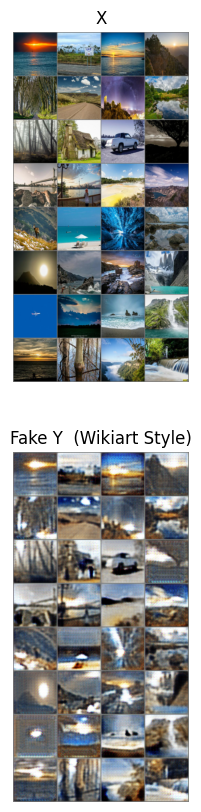

Epoch [  111/  128] | d_total_loss_avg: 0.2548 | g_total_loss: 8.4051
Epoch [  112/  128] | d_total_loss_avg: 0.2616 | g_total_loss: 8.0322
Epoch [  113/  128] | d_total_loss_avg: 0.2651 | g_total_loss: 8.6569
Epoch [  114/  128] | d_total_loss_avg: 0.2707 | g_total_loss: 8.8338
Epoch [  115/  128] | d_total_loss_avg: 0.3095 | g_total_loss: 8.7959
Epoch [  116/  128] | d_total_loss_avg: 0.3472 | g_total_loss: 9.5984
Epoch [  117/  128] | d_total_loss_avg: 0.3992 | g_total_loss: 8.5940
Epoch [  118/  128] | d_total_loss_avg: 0.3458 | g_total_loss: 8.7050
Epoch [  119/  128] | d_total_loss_avg: 0.2960 | g_total_loss: 8.4057
Epoch [  120/  128] | d_total_loss_avg: 0.2807 | g_total_loss: 8.2988


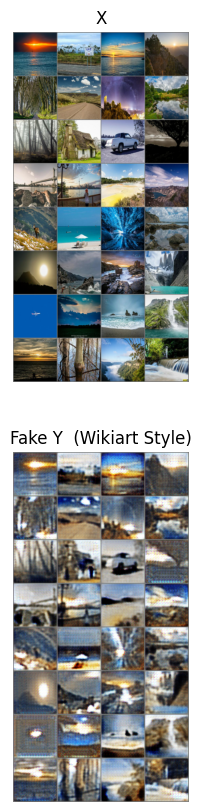

Epoch [  121/  128] | d_total_loss_avg: 0.2843 | g_total_loss: 8.3125
Epoch [  122/  128] | d_total_loss_avg: 0.2930 | g_total_loss: 8.3062
Epoch [  123/  128] | d_total_loss_avg: 0.3154 | g_total_loss: 8.8425
Epoch [  124/  128] | d_total_loss_avg: 0.3054 | g_total_loss: 8.8453
Epoch [  125/  128] | d_total_loss_avg: 0.2909 | g_total_loss: 9.0710
Epoch [  126/  128] | d_total_loss_avg: 0.2228 | g_total_loss: 8.8767
Epoch [  127/  128] | d_total_loss_avg: 0.2586 | g_total_loss: 9.1918
Epoch [  128/  128] | d_total_loss_avg: 0.2878 | g_total_loss: 8.4488


In [ ]:
n_epochs = epoch_true * batches_per_epoch
losses = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)

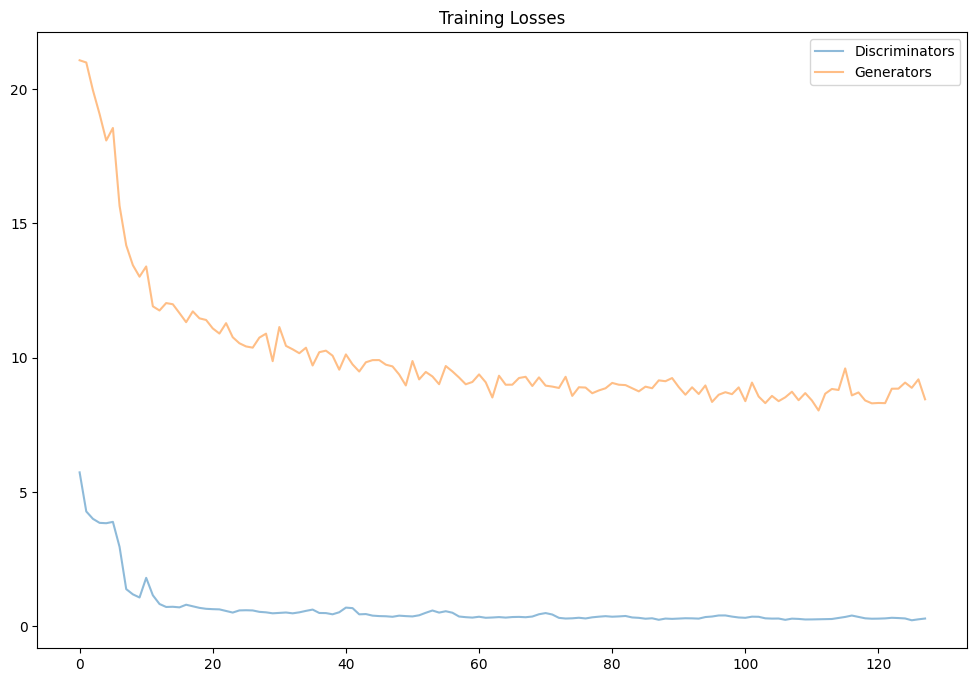

In [ ]:
#Plot loss functions over training
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminators', alpha=0.5)
plt.plot(losses.T[1], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()
plt.show()

In [ ]:
#Get some fixed data from domains X and Y for sampling. These are images that are held constant throughout training, that allow us to inspect the model's performance.
test_iter_X = iter(test_dataloader_X)
test_iter_Y = iter(test_dataloader_Y)

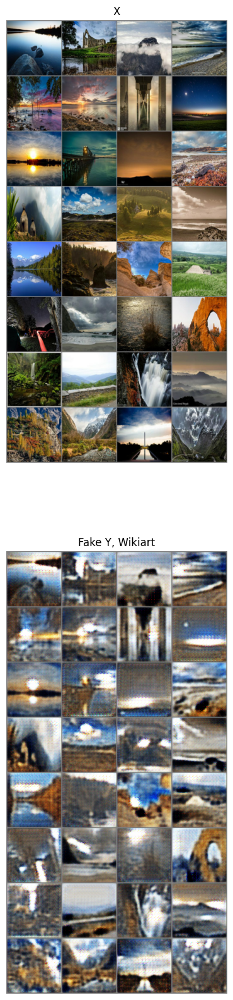

In [ ]:
#Sample
fixed_X = next(test_iter_X)
fixed_X = next(test_iter_X)
fixed_X = next(test_iter_X)

#Evaluation
G_XtoY.eval()

mean_=0.5
std_=0.5

#Identify correct device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Create fake pictures for both cycles
fake_Y = G_XtoY(fixed_X.to(device))

#Generate grids
grid_x =  make_grid(fixed_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
grid_fake_y =  make_grid(fake_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

#Normalize pictures to pixel range rom 0 to 255
X, fake_Y_ = reverse_normalize(grid_x, mean_, std_), reverse_normalize(grid_fake_y, mean_, std_)

#Transformation from X -> Y
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(30, 20))
ax1.imshow(X)
ax1.axis('off')
ax1.set_title('X')
ax2.imshow(fake_Y_)
ax2.axis('off')
ax2.set_title('Fake Y, Wikiart')
plt.show()

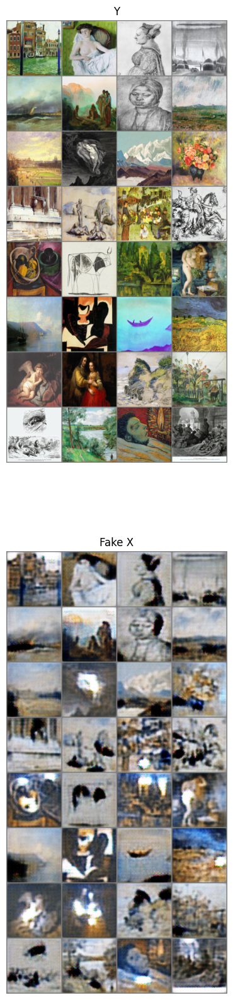

In [ ]:
#Sample
fixed_Y = next(test_iter_Y)
fixed_Y = next(test_iter_Y)
#fixed_Y = next(test_iter_Y)

#Evaluation
G_YtoX.eval()

mean_=0.5
std_=0.5

#Identify correct device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Create fake pictures for both cycles
fake_X = G_YtoX(fixed_Y.to(device))

#Generate grids
grid_y =  make_grid(fixed_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
grid_fake_x =  make_grid(fake_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

#Normalize pictures to pixel range rom 0 to 255
Y, fake_X_ = reverse_normalize(grid_y, mean_, std_), reverse_normalize(grid_fake_x, mean_, std_)

#Transformation from Y -> X
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(30, 20))
ax1.imshow(Y)
ax1.axis('off')
ax1.set_title('Y')
ax2.imshow(fake_X_)
ax2.axis('off')
ax2.set_title('Fake X')
plt.show()

## Credit

Part of this notebook's content is credited from these tutorials

https://pytorch.org/tutorials/advanced/neural_style_tutorial.html

https://www.kaggle.com/code/adrianda/cyclegan-pytorch-style-transfer
